In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

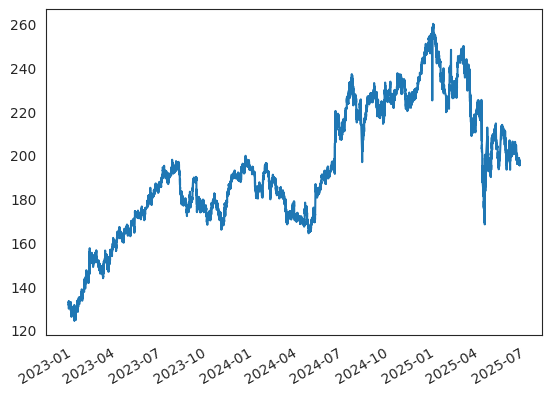

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# df_inds_test = df_inds_test[(df_inds_test.index >= '2023-06-20') & (df_inds_test.index < '2024-05-10')] #########################

# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test.close.plot()
df_inds_test

In [4]:
# importlib.reload(params) #####
importlib.reload(strategies) #####

first_day = df_inds_test.index.normalize().min()
start_ask = df_inds_test.loc[df_inds_test.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

# df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick
sess_start = params.sess_start_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_thresh      = params.rsi_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = sess_start
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = sess_start
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622


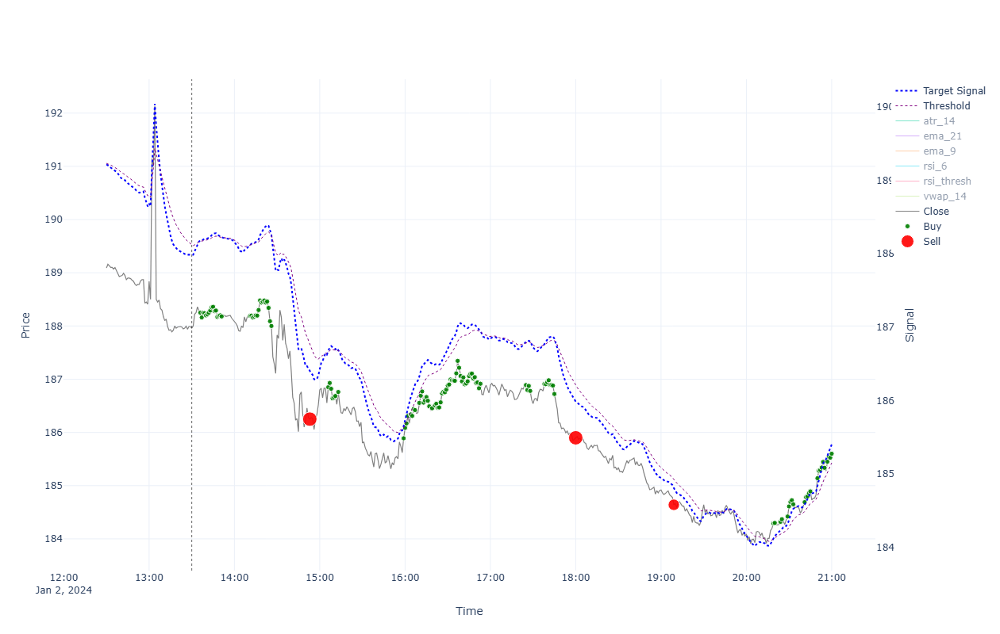


                                                  ******* Performance for 2024-01-02 *******

INTRADAY:
  shares(776); [ask_buy=187.998, fee_buy=0.004, pos_amnt_buy=145889.235]; [bid_sell=185.563, fee_sell=0.018, pos_amnt_sell=143982.626]; leftover=104.902; PNL=-1906.609
TRADES:
  Tr[1]: Time(13:36)Ask(188.288)Bid(188.212)Act(Buy)Shrs(1)Pos(105); CashTr(-188.292)=Cost(-188.288)-Fee(-0.004); P&L(117518.377)=CashTot(97756.081)+PosAmt(19762.297)
  Tr[2]: Time(13:37)Ask(188.198)Bid(188.122)Act(Buy)Shrs(1)Pos(106); CashTr(-188.202)=Cost(-188.198)-Fee(-0.004); P&L(117508.85)=CashTot(97567.879)+PosAmt(19940.971)
  Tr[3]: Time(13:38)Ask(188.288)Bid(188.212)Act(Buy)Shrs(1)Pos(107); CashTr(-188.292)=Cost(-188.288)-Fee(-0.004); P&L(117518.309)=CashTot(97379.587)+PosAmt(20138.721)
  Tr[4]: Time(13:39)Ask(188.278)Bid(188.202)Act(Buy)Shrs(1)Pos(108); CashTr(-188.282)=Cost(-188.278)-Fee(-0.004); P&L(117517.16)=CashTot(97191.306)+PosAmt(20325.854)
  Tr[5]: Time(13:40)Ask(188.238)Bid(188.162)Act(Buy)S

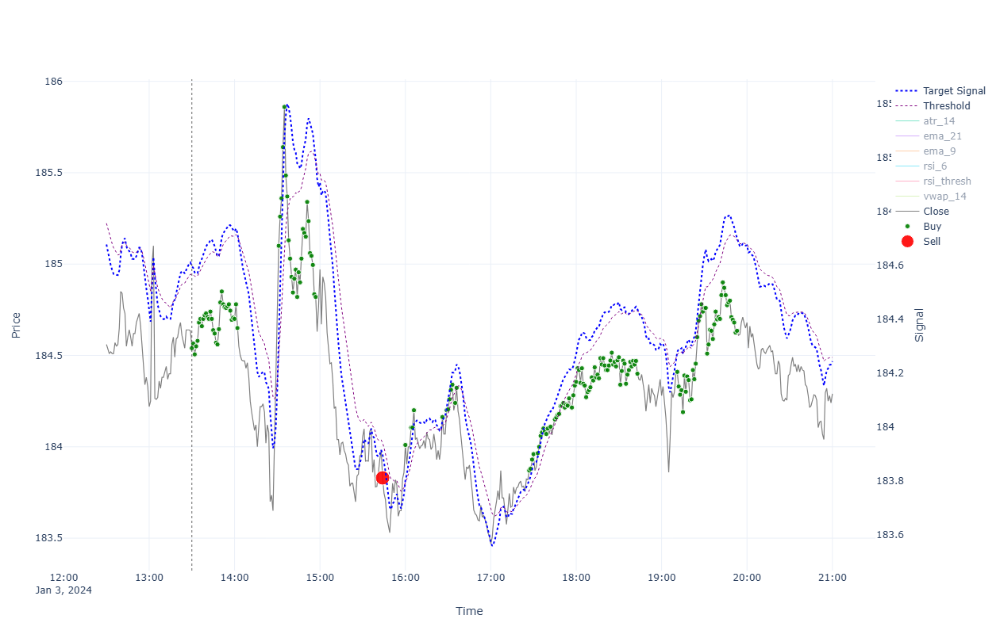


                                                  ******* Performance for 2024-01-03 *******

INTRADAY:
  shares(780); [ask_buy=184.577, fee_buy=0.004, pos_amnt_buy=143973.108]; [bid_sell=184.253, fee_sell=0.018, pos_amnt_sell=143703.233]; leftover=114.421; PNL=-269.876
TRADES:
  Tr[1]: Time(13:30)Ask(184.577)Bid(184.503)Act(Buy)Shrs(1)Pos(40); CashTr(-184.581)=Cost(-184.577)-Fee(-0.004); P&L(117090.584)=CashTot(109710.461)+PosAmt(7380.124)
  Tr[2]: Time(13:31)Ask(184.602)Bid(184.528)Act(Buy)Shrs(1)Pos(41); CashTr(-184.606)=Cost(-184.602)-Fee(-0.004); P&L(117091.506)=CashTot(109525.855)+PosAmt(7565.652)
  Tr[3]: Time(13:32)Ask(184.543)Bid(184.469)Act(Buy)Shrs(1)Pos(42); CashTr(-184.547)=Cost(-184.543)-Fee(-0.004); P&L(117089.01)=CashTot(109341.308)+PosAmt(7747.702)
  Tr[4]: Time(13:33)Ask(184.587)Bid(184.513)Act(Buy)Shrs(1)Pos(43); CashTr(-184.591)=Cost(-184.587)-Fee(-0.004); P&L(117090.78)=CashTot(109156.717)+PosAmt(7934.063)
  Tr[5]: Time(13:34)Ask(184.617)Bid(184.543)Act(Buy)Shrs(1

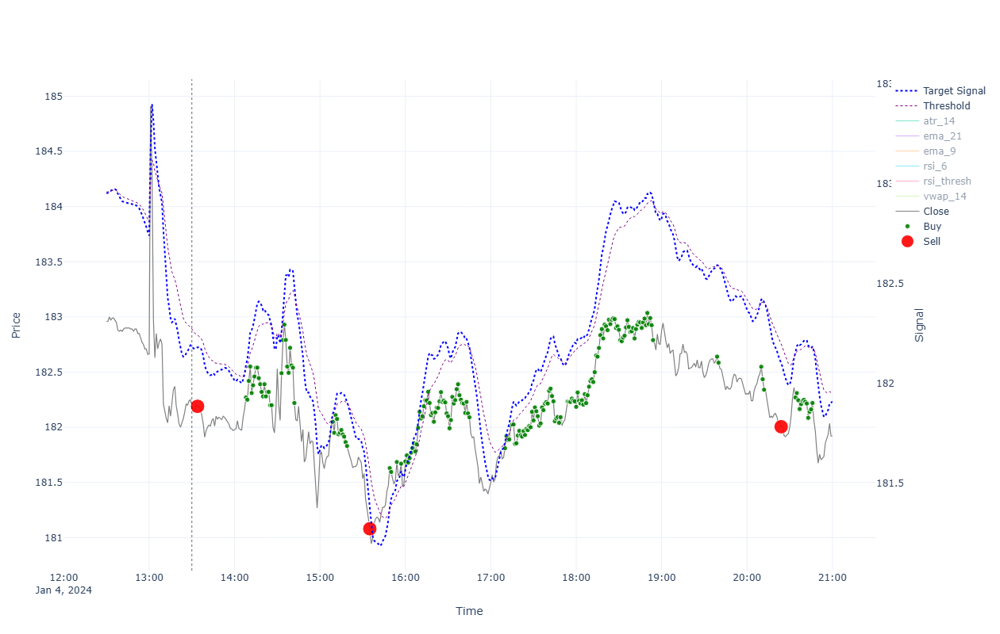


                                                  ******* Performance for 2024-01-04 *******

INTRADAY:
  shares(789); [ask_buy=182.196, fee_buy=0.004, pos_amnt_buy=143756.141]; [bid_sell=181.884, fee_sell=0.018, pos_amnt_sell=143491.834]; leftover=61.512; PNL=-264.307
TRADES:
  Tr[1]: Time(13:34)Ask(182.226)Bid(182.154)Act(Sell)Shrs(103)Pos(59); CashTr(18759.944)=Cost(18761.817)-Fee(-1.873); P&L(116645.882)=CashTot(105898.822)+PosAmt(10747.06)
  Tr[2]: Time(14:08)Ask(182.306)Bid(182.234)Act(Buy)Shrs(1)Pos(60); CashTr(-182.31)=Cost(-182.306)-Fee(-0.004); P&L(116650.524)=CashTot(105716.511)+PosAmt(10934.013)
  Tr[3]: Time(14:09)Ask(182.286)Bid(182.214)Act(Buy)Shrs(1)Pos(61); CashTr(-182.29)=Cost(-182.286)-Fee(-0.004); P&L(116649.247)=CashTot(105534.221)+PosAmt(11115.027)
  Tr[4]: Time(14:10)Ask(182.456)Bid(182.384)Act(Buy)Shrs(1)Pos(62); CashTr(-182.46)=Cost(-182.456)-Fee(-0.004); P&L(116659.538)=CashTot(105351.76)+PosAmt(11307.778)
  Tr[5]: Time(14:11)Ask(182.587)Bid(182.513)Act(Buy)S

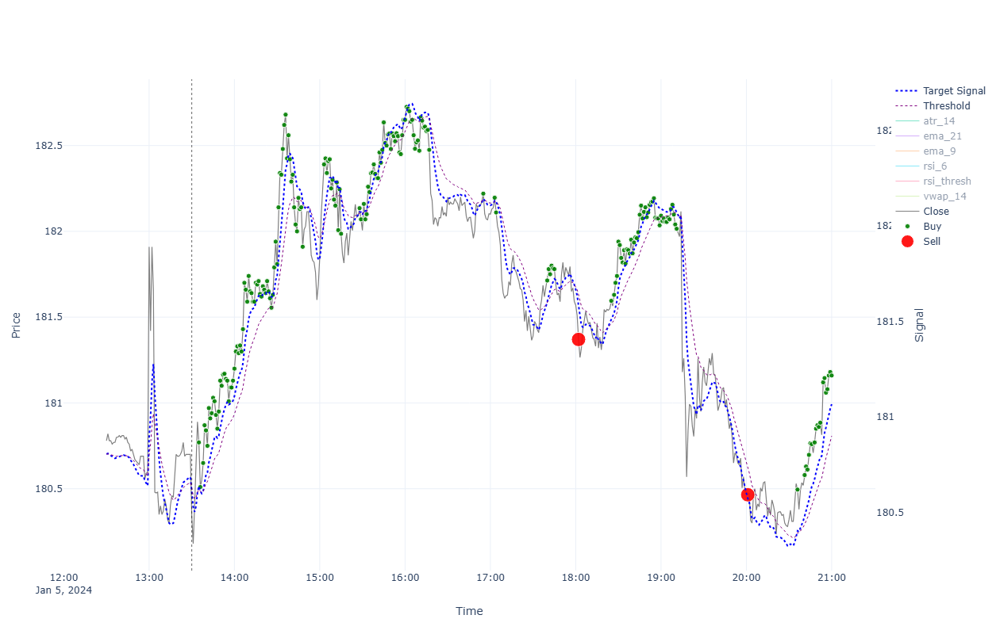


                                                  ******* Performance for 2024-01-05 *******

INTRADAY:
  shares(795); [ask_buy=180.376, fee_buy=0.004, pos_amnt_buy=143402.154]; [bid_sell=181.124, fee_sell=0.018, pos_amnt_sell=143978.961]; leftover=151.192; PNL=576.807
TRADES:
  Tr[1]: Time(13:35)Ask(180.806)Bid(180.734)Act(Buy)Shrs(1)Pos(84); CashTr(-180.81)=Cost(-180.806)-Fee(-0.004); P&L(116390.306)=CashTot(101208.663)+PosAmt(15181.643)
  Tr[2]: Time(13:36)Ask(180.546)Bid(180.474)Act(Buy)Shrs(1)Pos(85); CashTr(-180.55)=Cost(-180.546)-Fee(-0.004); P&L(116368.394)=CashTot(101028.113)+PosAmt(15340.281)
  Tr[3]: Time(13:38)Ask(180.686)Bid(180.614)Act(Buy)Shrs(1)Pos(86); CashTr(-180.69)=Cost(-180.686)-Fee(-0.004); P&L(116380.215)=CashTot(100847.422)+PosAmt(15532.793)
  Tr[4]: Time(13:39)Ask(180.906)Bid(180.834)Act(Buy)Shrs(1)Pos(87); CashTr(-180.91)=Cost(-180.906)-Fee(-0.004); P&L(116399.055)=CashTot(100666.512)+PosAmt(15732.543)
  Tr[5]: Time(13:40)Ask(180.876)Bid(180.804)Act(Buy)Shrs(

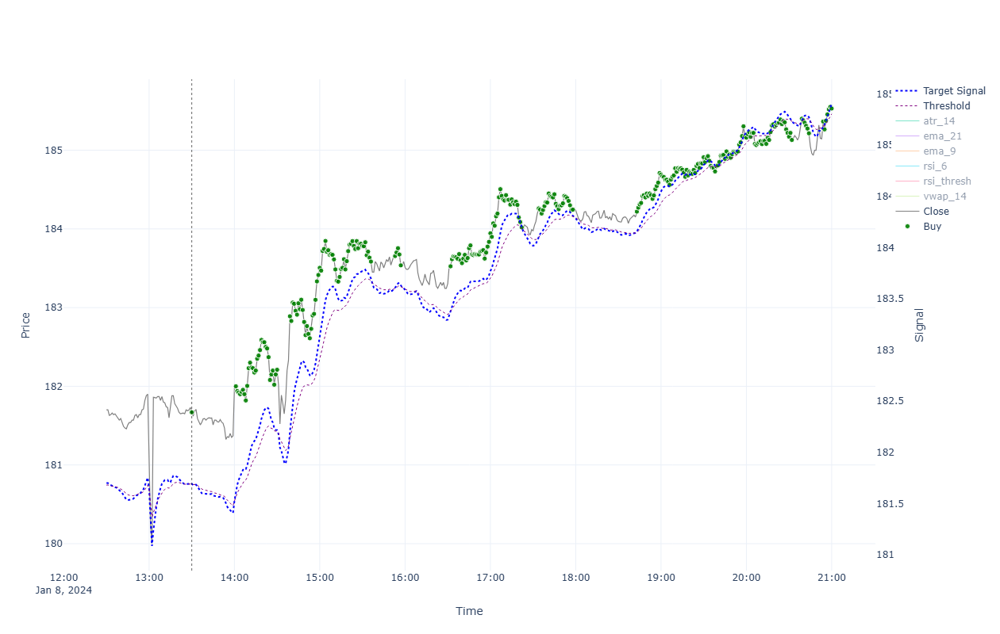


                                                  ******* Performance for 2024-01-08 *******

INTRADAY:
  shares(793); [ask_buy=181.706, fee_buy=0.004, pos_amnt_buy=144096.295]; [bid_sell=185.493, fee_sell=0.018, pos_amnt_sell=147081.387]; leftover=33.858; PNL=2985.092
TRADES:
  Tr[1]: Time(13:30)Ask(181.706)Bid(181.634)Act(Buy)Shrs(1)Pos(67); CashTr(-181.71)=Cost(-181.706)-Fee(-0.004); P&L(116261.781)=CashTot(104092.325)+PosAmt(12169.456)
  Tr[2]: Time(14:01)Ask(182.036)Bid(181.964)Act(Buy)Shrs(1)Pos(68); CashTr(-182.04)=Cost(-182.036)-Fee(-0.004); P&L(116283.81)=CashTot(103910.285)+PosAmt(12373.525)
  Tr[3]: Time(14:02)Ask(181.976)Bid(181.904)Act(Buy)Shrs(1)Pos(69); CashTr(-181.98)=Cost(-181.976)-Fee(-0.004); P&L(116279.654)=CashTot(103728.305)+PosAmt(12551.349)
  Tr[4]: Time(14:03)Ask(181.956)Bid(181.884)Act(Buy)Shrs(1)Pos(70); CashTr(-181.96)=Cost(-181.956)-Fee(-0.004); P&L(116278.197)=CashTot(103546.344)+PosAmt(12731.853)
  Tr[5]: Time(14:04)Ask(181.936)Bid(181.864)Act(Buy)Shrs(1

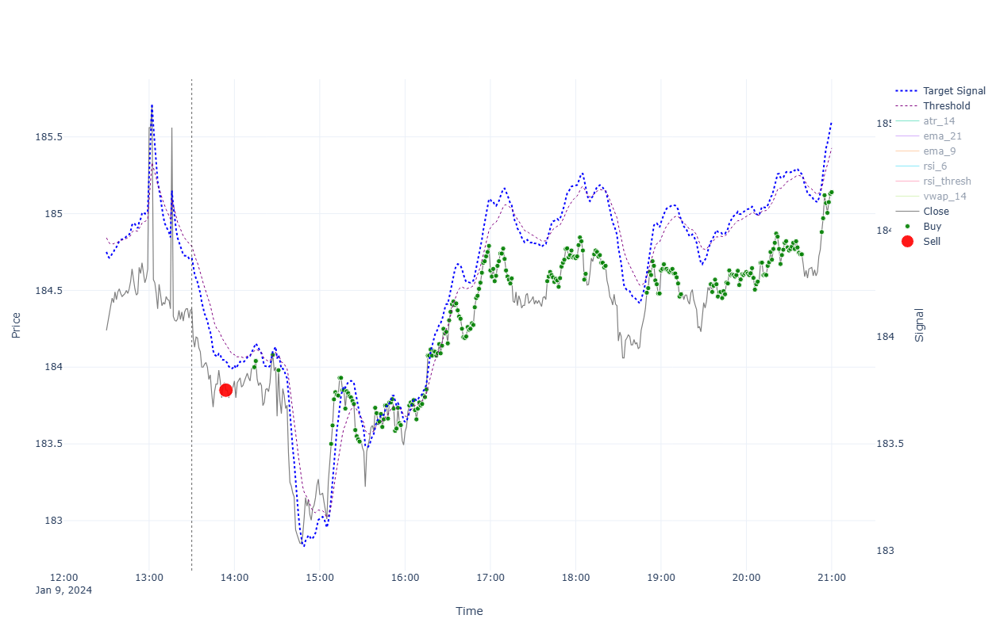


                                                  ******* Performance for 2024-01-09 *******

INTRADAY:
  shares(797); [ask_buy=184.417, fee_buy=0.004, pos_amnt_buy=146983.438]; [bid_sell=185.103, fee_sell=0.018, pos_amnt_sell=147512.525]; leftover=131.807; PNL=529.087
TRADES:
  Tr[1]: Time(13:54)Ask(183.887)Bid(183.813)Act(Sell)Shrs(227)Pos(132); CashTr(41721.468)=Cost(41725.603)-Fee(-4.136); P&L(116308.399)=CashTot(92045.053)+PosAmt(24263.346)
  Tr[2]: Time(14:14)Ask(184.037)Bid(183.963)Act(Buy)Shrs(1)Pos(133); CashTr(-184.041)=Cost(-184.037)-Fee(-0.004); P&L(116328.117)=CashTot(91861.012)+PosAmt(24467.106)
  Tr[3]: Time(14:15)Ask(184.077)Bid(184.003)Act(Buy)Shrs(1)Pos(134); CashTr(-184.081)=Cost(-184.077)-Fee(-0.004); P&L(116333.359)=CashTot(91676.931)+PosAmt(24656.428)
  Tr[4]: Time(14:27)Ask(184.117)Bid(184.043)Act(Buy)Shrs(1)Pos(135); CashTr(-184.121)=Cost(-184.117)-Fee(-0.004); P&L(116338.64)=CashTot(91492.81)+PosAmt(24845.83)
  Tr[5]: Time(14:31)Ask(184.017)Bid(183.943)Act(Buy

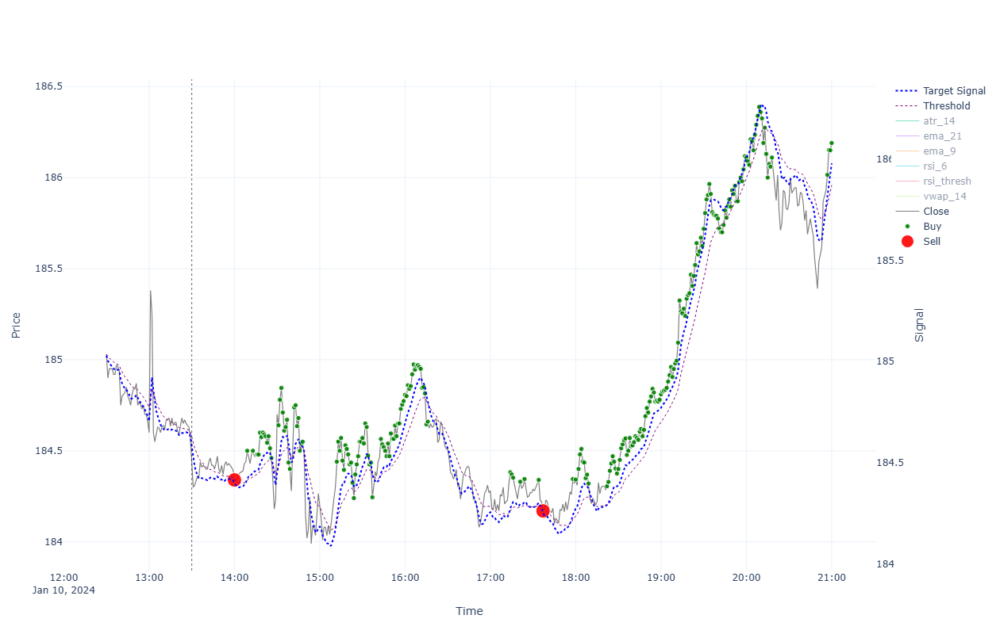


                                                  ******* Performance for 2024-01-10 *******

INTRADAY:
  shares(800); [ask_buy=184.437, fee_buy=0.004, pos_amnt_buy=147552.704]; [bid_sell=186.153, fee_sell=0.018, pos_amnt_sell=148907.592]; leftover=91.628; PNL=1354.888
TRADES:
  Tr[1]: Time(14:00)Ask(184.377)Bid(184.303)Act(Sell)Shrs(243)Pos(140); CashTr(44781.231)=Cost(44785.661)-Fee(-4.43); P&L(116334.789)=CashTot(90532.351)+PosAmt(25802.438)
  Tr[2]: Time(14:09)Ask(184.537)Bid(184.463)Act(Buy)Shrs(1)Pos(141); CashTr(-184.541)=Cost(-184.537)-Fee(-0.004); P&L(116357.107)=CashTot(90347.81)+PosAmt(26009.297)
  Tr[3]: Time(14:13)Ask(184.537)Bid(184.463)Act(Buy)Shrs(1)Pos(142); CashTr(-184.541)=Cost(-184.537)-Fee(-0.004); P&L(116357.029)=CashTot(90163.269)+PosAmt(26193.76)
  Tr[4]: Time(14:16)Ask(184.517)Bid(184.443)Act(Buy)Shrs(1)Pos(143); CashTr(-184.521)=Cost(-184.517)-Fee(-0.004); P&L(116354.112)=CashTot(89978.748)+PosAmt(26375.364)
  Tr[5]: Time(14:17)Ask(184.516)Bid(184.442)Act(Buy

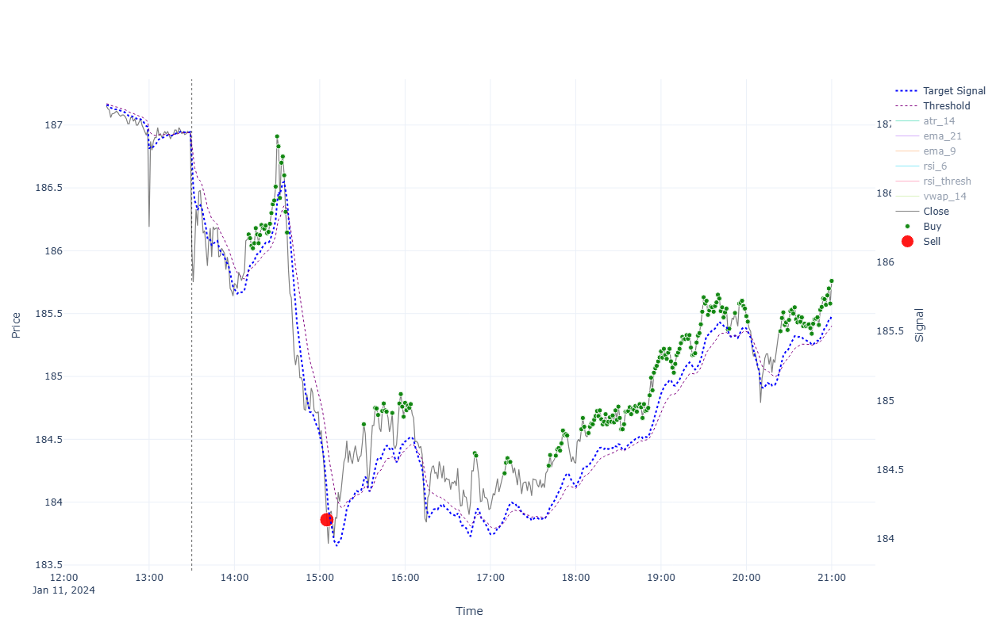


                                                  ******* Performance for 2024-01-11 *******

INTRADAY:
  shares(800); [ask_buy=186.057, fee_buy=0.004, pos_amnt_buy=148848.963]; [bid_sell=185.723, fee_sell=0.018, pos_amnt_sell=148563.669]; leftover=150.257; PNL=-285.294
TRADES:
  Tr[1]: Time(14:10)Ask(186.167)Bid(186.093)Act(Buy)Shrs(1)Pos(218); CashTr(-186.171)=Cost(-186.167)-Fee(-0.004); P&L(116530.054)=CashTot(75961.83)+PosAmt(40568.225)
  Tr[2]: Time(14:11)Ask(186.137)Bid(186.063)Act(Buy)Shrs(1)Pos(219); CashTr(-186.141)=Cost(-186.137)-Fee(-0.004); P&L(116523.437)=CashTot(75775.688)+PosAmt(40747.749)
  Tr[3]: Time(14:12)Ask(186.077)Bid(186.003)Act(Buy)Shrs(1)Pos(220); CashTr(-186.081)=Cost(-186.077)-Fee(-0.004); P&L(116510.221)=CashTot(75589.607)+PosAmt(40920.614)
  Tr[4]: Time(14:13)Ask(186.057)Bid(185.983)Act(Buy)Shrs(1)Pos(221); CashTr(-186.061)=Cost(-186.057)-Fee(-0.004); P&L(116505.744)=CashTot(75403.546)+PosAmt(41102.198)
  Tr[5]: Time(14:14)Ask(186.097)Bid(186.023)Act(Buy)S

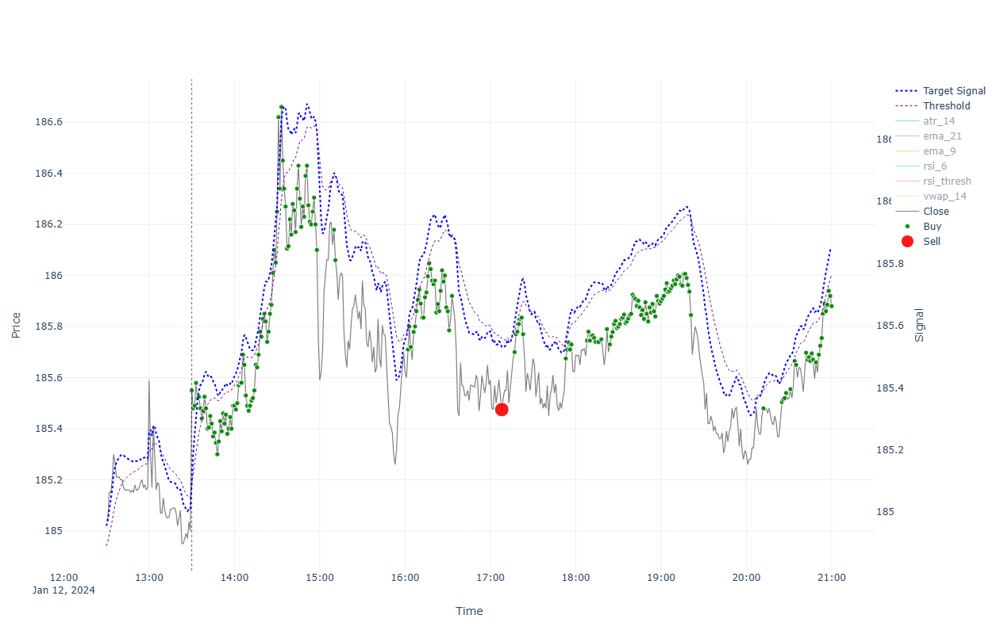


                                                  ******* Performance for 2024-01-12 *******

INTRADAY:
  shares(801); [ask_buy=185.587, fee_buy=0.004, pos_amnt_buy=148658.479]; [bid_sell=185.843, fee_sell=0.018, pos_amnt_sell=148845.472]; leftover=55.447; PNL=186.993
TRADES:
  Tr[1]: Time(13:30)Ask(185.587)Bid(185.513)Act(Buy)Shrs(1)Pos(275); CashTr(-185.591)=Cost(-185.587)-Fee(-0.004); P&L(116193.676)=CashTot(65177.632)+PosAmt(51016.045)
  Tr[2]: Time(13:31)Ask(185.517)Bid(185.443)Act(Buy)Shrs(1)Pos(276); CashTr(-185.521)=Cost(-185.517)-Fee(-0.004); P&L(116174.352)=CashTot(64992.111)+PosAmt(51182.242)
  Tr[3]: Time(13:32)Ask(185.527)Bid(185.453)Act(Buy)Shrs(1)Pos(277); CashTr(-185.531)=Cost(-185.527)-Fee(-0.004); P&L(116177.033)=CashTot(64806.579)+PosAmt(51370.454)
  Tr[4]: Time(13:33)Ask(185.616)Bid(185.542)Act(Buy)Shrs(1)Pos(278); CashTr(-185.62)=Cost(-185.616)-Fee(-0.004); P&L(116201.686)=CashTot(64620.959)+PosAmt(51580.727)
  Tr[5]: Time(13:34)Ask(185.557)Bid(185.483)Act(Buy)Shr

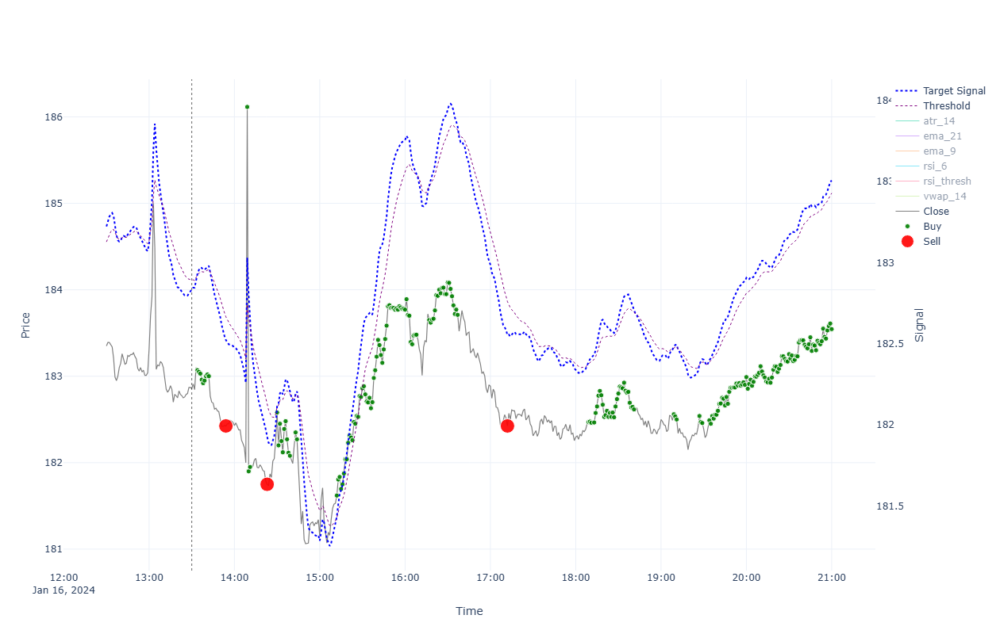


                                                  ******* Performance for 2024-01-16 *******

INTRADAY:
  shares(814); [ask_buy=182.897, fee_buy=0.004, pos_amnt_buy=148881.066]; [bid_sell=183.508, fee_sell=0.018, pos_amnt_sell=149360.925]; leftover=19.853; PNL=479.859
TRADES:
  Tr[1]: Time(13:34)Ask(183.107)Bid(183.033)Act(Buy)Shrs(1)Pos(251); CashTr(-183.111)=Cost(-183.107)-Fee(-0.004); P&L(115471.098)=CashTot(69529.718)+PosAmt(45941.38)
  Tr[2]: Time(13:35)Ask(183.087)Bid(183.013)Act(Buy)Shrs(1)Pos(252); CashTr(-183.091)=Cost(-183.087)-Fee(-0.004); P&L(115466.002)=CashTot(69346.627)+PosAmt(46119.374)
  Tr[3]: Time(13:36)Ask(183.067)Bid(182.993)Act(Buy)Shrs(1)Pos(253); CashTr(-183.071)=Cost(-183.067)-Fee(-0.004); P&L(115460.885)=CashTot(69163.557)+PosAmt(46297.329)
  Tr[4]: Time(13:37)Ask(182.997)Bid(182.923)Act(Buy)Shrs(1)Pos(254); CashTr(-183.001)=Cost(-182.997)-Fee(-0.004); P&L(115443.102)=CashTot(68980.556)+PosAmt(46462.546)
  Tr[5]: Time(13:38)Ask(182.957)Bid(182.883)Act(Buy)Shr

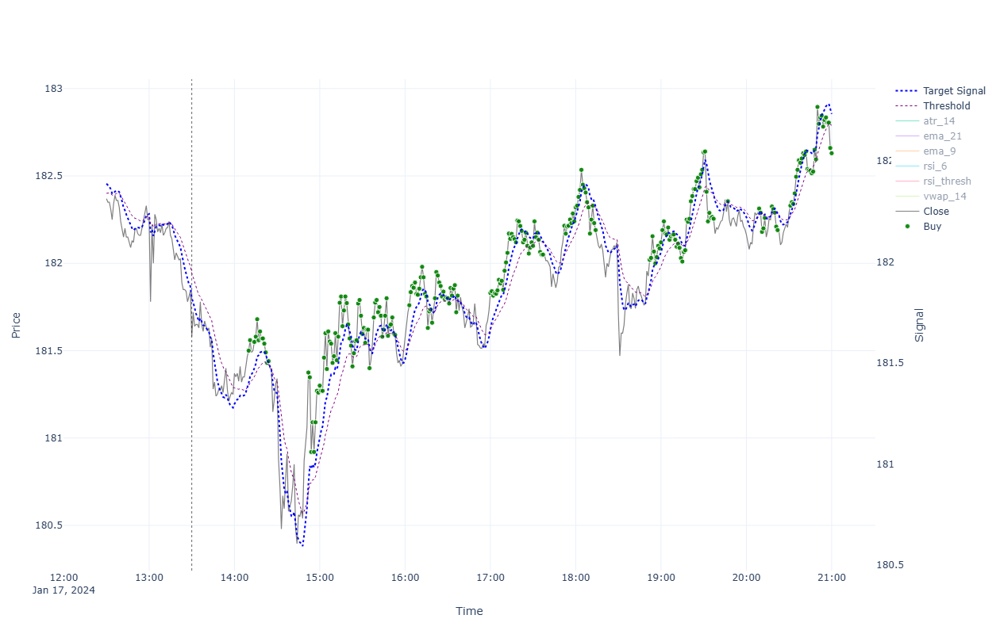


                                                  ******* Performance for 2024-01-17 *******

INTRADAY:
  shares(822); [ask_buy=181.616, fee_buy=0.004, pos_amnt_buy=149291.9]; [bid_sell=182.593, fee_sell=0.018, pos_amnt_sell=150076.883]; leftover=88.878; PNL=784.983
TRADES:
  Tr[1]: Time(14:10)Ask(181.536)Bid(181.464)Act(Buy)Shrs(1)Pos(172); CashTr(-181.54)=Cost(-181.536)-Fee(-0.004); P&L(114952.311)=CashTot(83740.555)+PosAmt(31211.756)
  Tr[2]: Time(14:11)Ask(181.596)Bid(181.524)Act(Buy)Shrs(1)Pos(173); CashTr(-181.6)=Cost(-181.596)-Fee(-0.004); P&L(114962.552)=CashTot(83558.954)+PosAmt(31403.598)
  Tr[3]: Time(14:14)Ask(181.586)Bid(181.514)Act(Buy)Shrs(1)Pos(174); CashTr(-181.59)=Cost(-181.586)-Fee(-0.004); P&L(114960.746)=CashTot(83377.364)+PosAmt(31583.382)
  Tr[4]: Time(14:15)Ask(181.616)Bid(181.544)Act(Buy)Shrs(1)Pos(175); CashTr(-181.62)=Cost(-181.616)-Fee(-0.004); P&L(114965.889)=CashTot(83195.744)+PosAmt(31770.145)
  Tr[5]: Time(14:16)Ask(181.716)Bid(181.644)Act(Buy)Shrs(1)Po

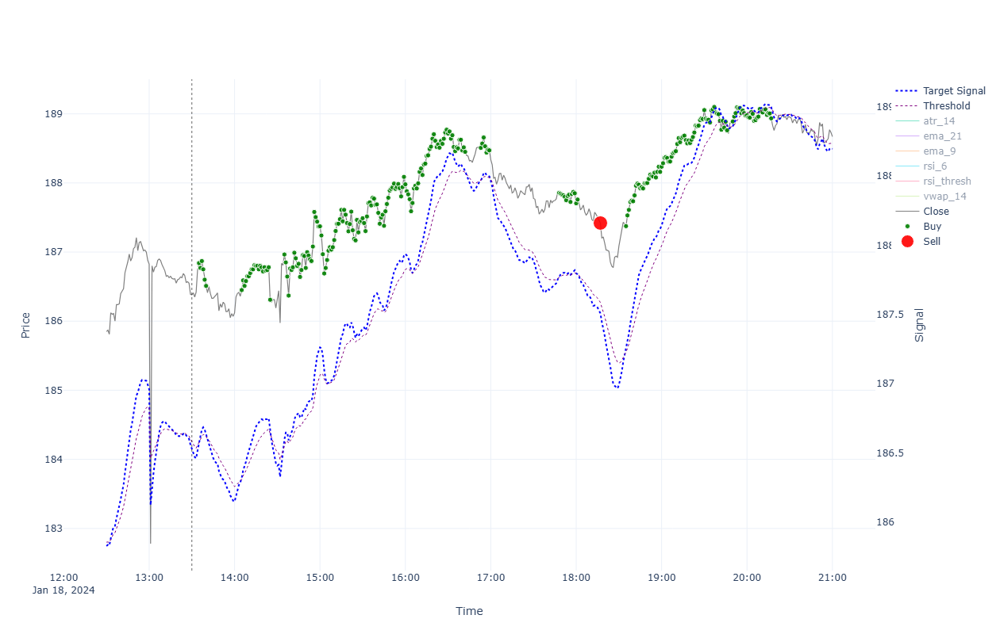


                                                  ******* Performance for 2024-01-18 *******

INTRADAY:
  shares(805); [ask_buy=186.417, fee_buy=0.004, pos_amnt_buy=150069.127]; [bid_sell=188.632, fee_sell=0.018, pos_amnt_sell=151834.22]; leftover=96.634; PNL=1765.092
TRADES:
  Tr[1]: Time(13:35)Ask(186.877)Bid(186.803)Act(Buy)Shrs(1)Pos(427); CashTr(-186.881)=Cost(-186.877)-Fee(-0.004); P&L(117077.591)=CashTot(37312.867)+PosAmt(79764.724)
  Tr[2]: Time(13:36)Ask(186.807)Bid(186.733)Act(Buy)Shrs(1)Pos(428); CashTr(-186.811)=Cost(-186.807)-Fee(-0.004); P&L(117047.628)=CashTot(37126.055)+PosAmt(79921.572)
  Tr[3]: Time(13:37)Ask(186.907)Bid(186.833)Act(Buy)Shrs(1)Pos(429); CashTr(-186.911)=Cost(-186.907)-Fee(-0.004); P&L(117090.341)=CashTot(36939.144)+PosAmt(80151.197)
  Tr[4]: Time(13:38)Ask(186.787)Bid(186.713)Act(Buy)Shrs(1)Pos(430); CashTr(-186.791)=Cost(-186.787)-Fee(-0.004); P&L(117038.792)=CashTot(36752.353)+PosAmt(80286.439)
  Tr[5]: Time(13:39)Ask(186.637)Bid(186.563)Act(Buy)Sh

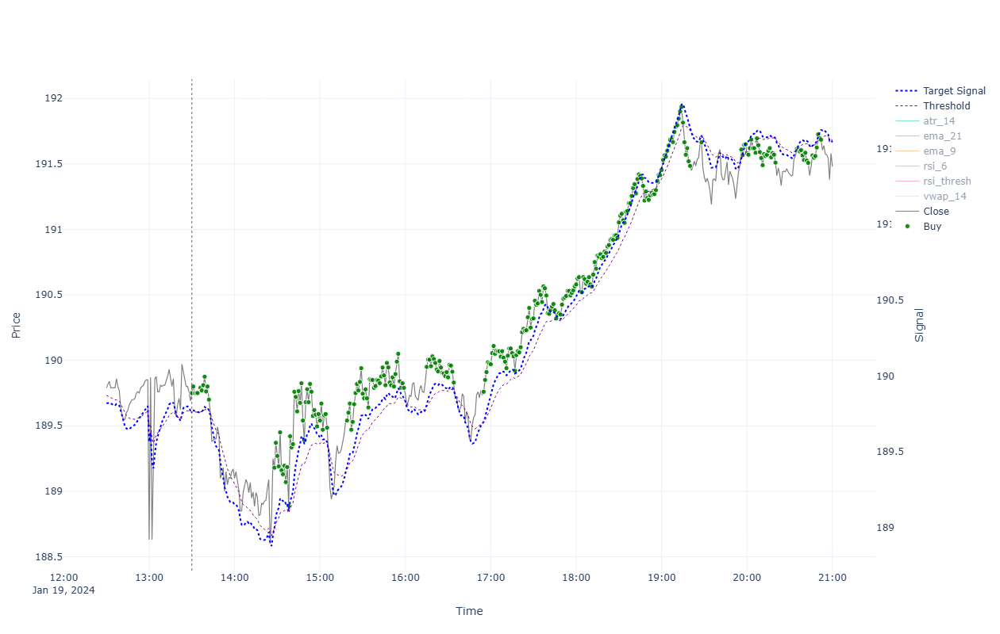


                                                  ******* Performance for 2024-01-19 *******

INTRADAY:
  shares(800); [ask_buy=189.788, fee_buy=0.004, pos_amnt_buy=151833.56]; [bid_sell=191.442, fee_sell=0.018, pos_amnt_sell=153138.649]; leftover=97.294; PNL=1305.089
TRADES:
  Tr[1]: Time(13:30)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(322); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(117899.318)=CashTot(56812.038)+PosAmt(61087.28)
  Tr[2]: Time(13:31)Ask(189.838)Bid(189.762)Act(Buy)Shrs(1)Pos(323); CashTr(-189.842)=Cost(-189.838)-Fee(-0.004); P&L(117915.335)=CashTot(56622.196)+PosAmt(61293.139)
  Tr[3]: Time(13:32)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(324); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(117899.109)=CashTot(56432.404)+PosAmt(61466.704)
  Tr[4]: Time(13:33)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(325); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(117899.029)=CashTot(56242.612)+PosAmt(61656.416)
  Tr[5]: Time(13:34)Ask(189.788)Bid(189.712)Act(Buy)Shr

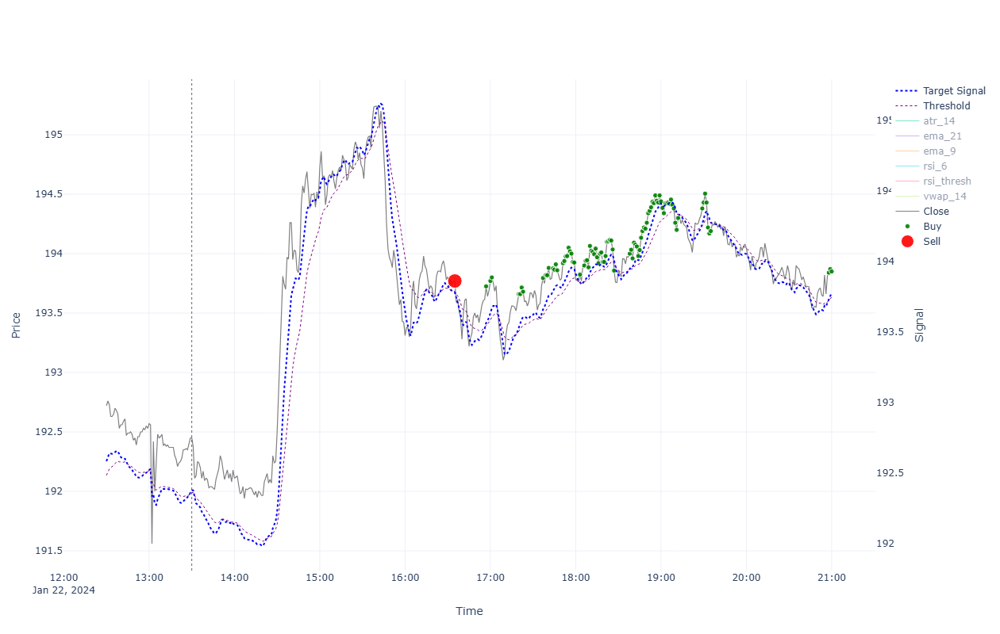


                                                  ******* Performance for 2024-01-22 *******

INTRADAY:
  shares(796); [ask_buy=192.488, fee_buy=0.004, pos_amnt_buy=153224.022]; [bid_sell=193.811, fee_sell=0.018, pos_amnt_sell=154259.055]; leftover=11.92; PNL=1035.033
TRADES:
  Tr[1]: Time(16:35)Ask(193.809)Bid(193.731)Act(Sell)Shrs(392)Pos(228); CashTr(75935.418)=Cost(75942.648)-Fee(-7.231); P&L(120138.912)=CashTot(75968.188)+PosAmt(44170.724)
  Tr[2]: Time(16:57)Ask(193.764)Bid(193.686)Act(Buy)Shrs(1)Pos(229); CashTr(-193.768)=Cost(-193.764)-Fee(-0.004); P&L(120128.573)=CashTot(75774.421)+PosAmt(44354.152)
  Tr[3]: Time(17:00)Ask(193.809)Bid(193.731)Act(Buy)Shrs(1)Pos(230); CashTr(-193.813)=Cost(-193.809)-Fee(-0.004); P&L(120138.794)=CashTot(75580.608)+PosAmt(44558.187)
  Tr[4]: Time(17:01)Ask(193.839)Bid(193.761)Act(Buy)Shrs(1)Pos(231); CashTr(-193.843)=Cost(-193.839)-Fee(-0.004); P&L(120145.611)=CashTot(75386.765)+PosAmt(44758.846)
  Tr[5]: Time(17:20)Ask(193.699)Bid(193.621)Act(B

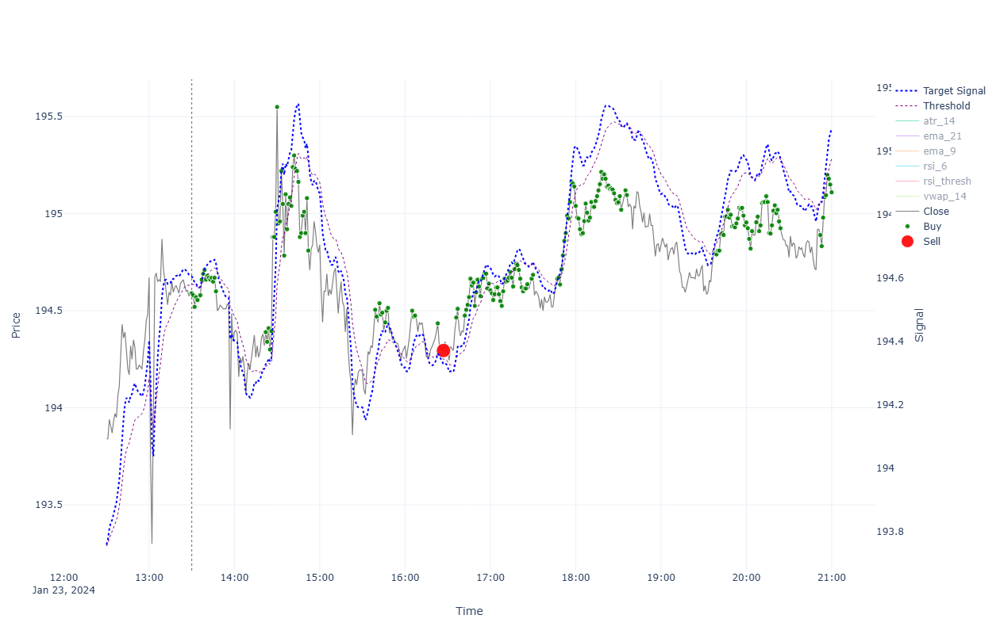


                                                  ******* Performance for 2024-01-23 *******

INTRADAY:
  shares(792); [ask_buy=194.629, fee_buy=0.004, pos_amnt_buy=154149.271]; [bid_sell=195.071, fee_sell=0.018, pos_amnt_sell=154481.581]; leftover=121.704; PNL=332.31
TRADES:
  Tr[1]: Time(13:30)Ask(194.629)Bid(194.551)Act(Buy)Shrs(1)Pos(321); CashTr(-194.633)=Cost(-194.629)-Fee(-0.004); P&L(120364.44)=CashTot(57913.542)+PosAmt(62450.897)
  Tr[2]: Time(13:31)Ask(194.619)Bid(194.541)Act(Buy)Shrs(1)Pos(322); CashTr(-194.623)=Cost(-194.619)-Fee(-0.004); P&L(120361.148)=CashTot(57718.919)+PosAmt(62642.229)
  Tr[3]: Time(13:32)Ask(194.559)Bid(194.481)Act(Buy)Shrs(1)Pos(323); CashTr(-194.563)=Cost(-194.559)-Fee(-0.004); P&L(120341.75)=CashTot(57524.356)+PosAmt(62817.394)
  Tr[4]: Time(13:33)Ask(194.609)Bid(194.531)Act(Buy)Shrs(1)Pos(324); CashTr(-194.613)=Cost(-194.609)-Fee(-0.004); P&L(120357.815)=CashTot(57329.744)+PosAmt(63028.072)
  Tr[5]: Time(13:34)Ask(194.594)Bid(194.516)Act(Buy)Shrs

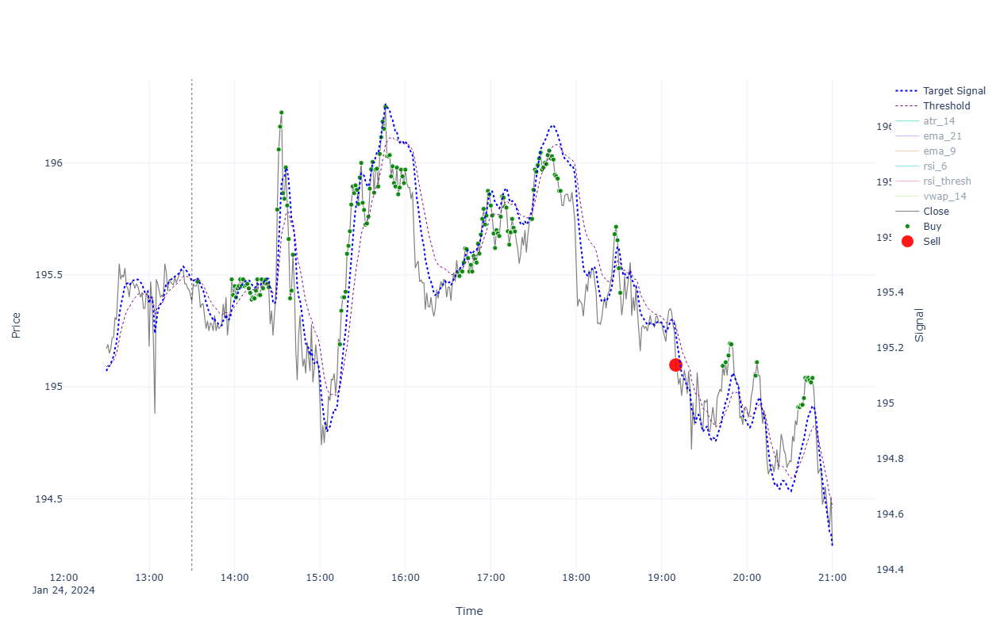


                                                  ******* Performance for 2024-01-24 *******

INTRADAY:
  shares(791); [ask_buy=195.419, fee_buy=0.004, pos_amnt_buy=154579.653]; [bid_sell=194.261, fee_sell=0.018, pos_amnt_sell=153645.962]; leftover=23.633; PNL=-933.691
TRADES:
  Tr[1]: Time(13:34)Ask(195.509)Bid(195.431)Act(Buy)Shrs(1)Pos(291); CashTr(-195.513)=Cost(-195.509)-Fee(-0.004); P&L(120473.863)=CashTot(63603.469)+PosAmt(56870.394)
  Tr[2]: Time(13:58)Ask(195.519)Bid(195.441)Act(Buy)Shrs(1)Pos(292); CashTr(-195.523)=Cost(-195.519)-Fee(-0.004); P&L(120476.69)=CashTot(63407.946)+PosAmt(57068.744)
  Tr[3]: Time(13:59)Ask(195.449)Bid(195.371)Act(Buy)Shrs(1)Pos(293); CashTr(-195.453)=Cost(-195.449)-Fee(-0.004); P&L(120456.172)=CashTot(63212.493)+PosAmt(57243.679)
  Tr[4]: Time(14:00)Ask(195.489)Bid(195.411)Act(Buy)Shrs(1)Pos(294); CashTr(-195.493)=Cost(-195.489)-Fee(-0.004); P&L(120467.808)=CashTot(63017.0)+PosAmt(57450.808)
  Tr[5]: Time(14:01)Ask(195.439)Bid(195.361)Act(Buy)Shrs

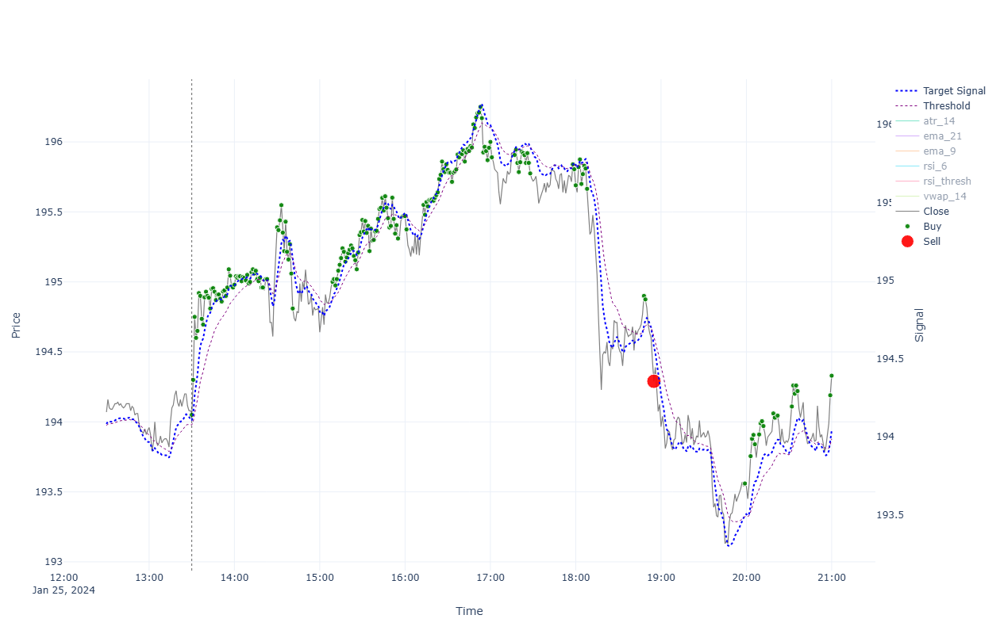


                                                  ******* Performance for 2024-01-25 *******

INTRADAY:
  shares(791); [ask_buy=194.089, fee_buy=0.004, pos_amnt_buy=153527.413]; [bid_sell=194.291, fee_sell=0.018, pos_amnt_sell=153669.687]; leftover=142.182; PNL=142.274
TRADES:
  Tr[1]: Time(13:30)Ask(194.089)Bid(194.011)Act(Buy)Shrs(1)Pos(182); CashTr(-194.093)=Cost(-194.089)-Fee(-0.004); P&L(120059.087)=CashTot(84749.05)+PosAmt(35310.037)
  Tr[2]: Time(13:31)Ask(194.339)Bid(194.261)Act(Buy)Shrs(1)Pos(183); CashTr(-194.343)=Cost(-194.339)-Fee(-0.004); P&L(120104.496)=CashTot(84554.707)+PosAmt(35549.789)
  Tr[3]: Time(13:32)Ask(194.789)Bid(194.711)Act(Buy)Shrs(1)Pos(184); CashTr(-194.793)=Cost(-194.789)-Fee(-0.004); P&L(120186.747)=CashTot(84359.914)+PosAmt(35826.833)
  Tr[4]: Time(13:33)Ask(194.639)Bid(194.561)Act(Buy)Shrs(1)Pos(185); CashTr(-194.643)=Cost(-194.639)-Fee(-0.004); P&L(120159.071)=CashTot(84165.271)+PosAmt(35993.8)
  Tr[5]: Time(13:34)Ask(194.689)Bid(194.611)Act(Buy)Shrs

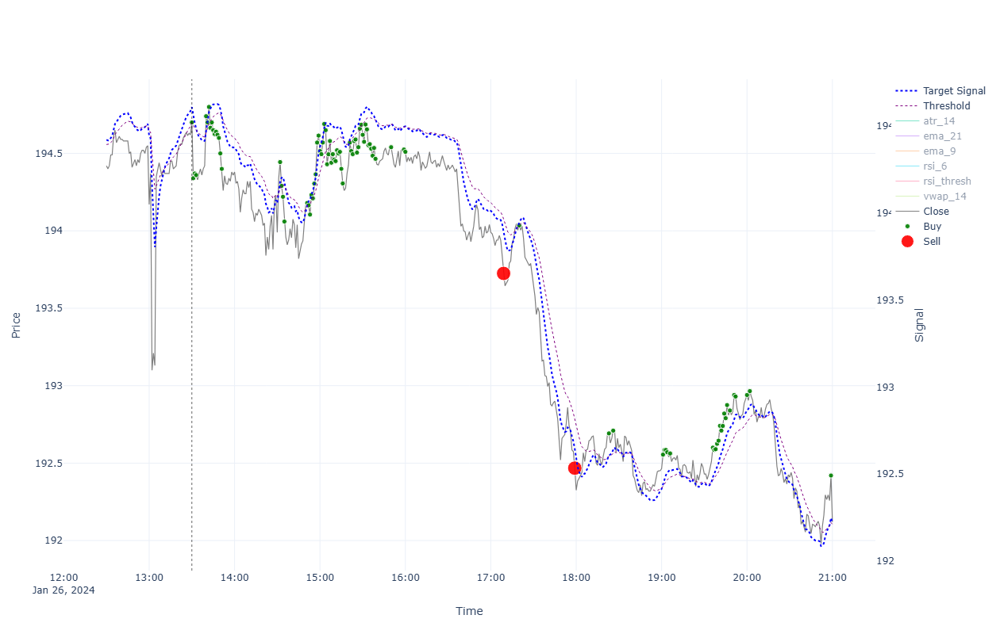


                                                  ******* Performance for 2024-01-26 *******

INTRADAY:
  shares(789); [ask_buy=194.739, fee_buy=0.004, pos_amnt_buy=153652.18]; [bid_sell=192.082, fee_sell=0.018, pos_amnt_sell=151537.84]; leftover=159.689; PNL=-2114.34
TRADES:
  Tr[1]: Time(13:30)Ask(194.739)Bid(194.661)Act(Buy)Shrs(1)Pos(156); CashTr(-194.743)=Cost(-194.739)-Fee(-0.004); P&L(119940.761)=CashTot(89573.636)+PosAmt(30367.125)
  Tr[2]: Time(13:31)Ask(194.379)Bid(194.301)Act(Buy)Shrs(1)Pos(157); CashTr(-194.383)=Cost(-194.379)-Fee(-0.004); P&L(119884.531)=CashTot(89379.253)+PosAmt(30505.278)
  Tr[3]: Time(13:32)Ask(194.409)Bid(194.331)Act(Buy)Shrs(1)Pos(158); CashTr(-194.413)=Cost(-194.409)-Fee(-0.004); P&L(119889.158)=CashTot(89184.84)+PosAmt(30704.318)
  Tr[4]: Time(13:33)Ask(194.399)Bid(194.321)Act(Buy)Shrs(1)Pos(159); CashTr(-194.403)=Cost(-194.399)-Fee(-0.004); P&L(119887.497)=CashTot(88990.437)+PosAmt(30897.059)
  Tr[5]: Time(13:40)Ask(194.779)Bid(194.701)Act(Buy)Shr

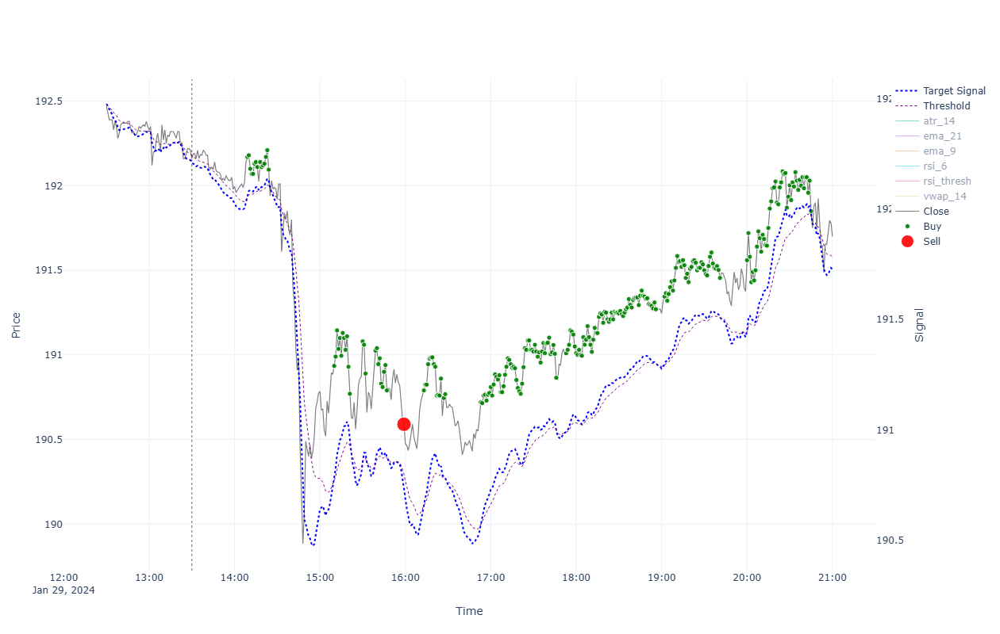


                                                  ******* Performance for 2024-01-29 *******

INTRADAY:
  shares(789); [ask_buy=192.198, fee_buy=0.004, pos_amnt_buy=151647.719]; [bid_sell=191.662, fee_sell=0.018, pos_amnt_sell=151206.534]; leftover=49.81; PNL=-441.185
TRADES:
  Tr[1]: Time(14:09)Ask(192.208)Bid(192.132)Act(Buy)Shrs(1)Pos(55); CashTr(-192.212)=Cost(-192.208)-Fee(-0.004); P&L(119599.254)=CashTot(109032.018)+PosAmt(10567.236)
  Tr[2]: Time(14:10)Ask(192.218)Bid(192.142)Act(Buy)Shrs(1)Pos(56); CashTr(-192.222)=Cost(-192.218)-Fee(-0.004); P&L(119599.723)=CashTot(108839.795)+PosAmt(10759.928)
  Tr[3]: Time(14:11)Ask(192.138)Bid(192.062)Act(Buy)Shrs(1)Pos(57); CashTr(-192.142)=Cost(-192.138)-Fee(-0.004); P&L(119595.163)=CashTot(108647.653)+PosAmt(10947.51)
  Tr[4]: Time(14:12)Ask(192.108)Bid(192.032)Act(Buy)Shrs(1)Pos(58); CashTr(-192.112)=Cost(-192.108)-Fee(-0.004); P&L(119593.373)=CashTot(108455.541)+PosAmt(11137.832)
  Tr[5]: Time(14:13)Ask(192.108)Bid(192.032)Act(Buy)Shr

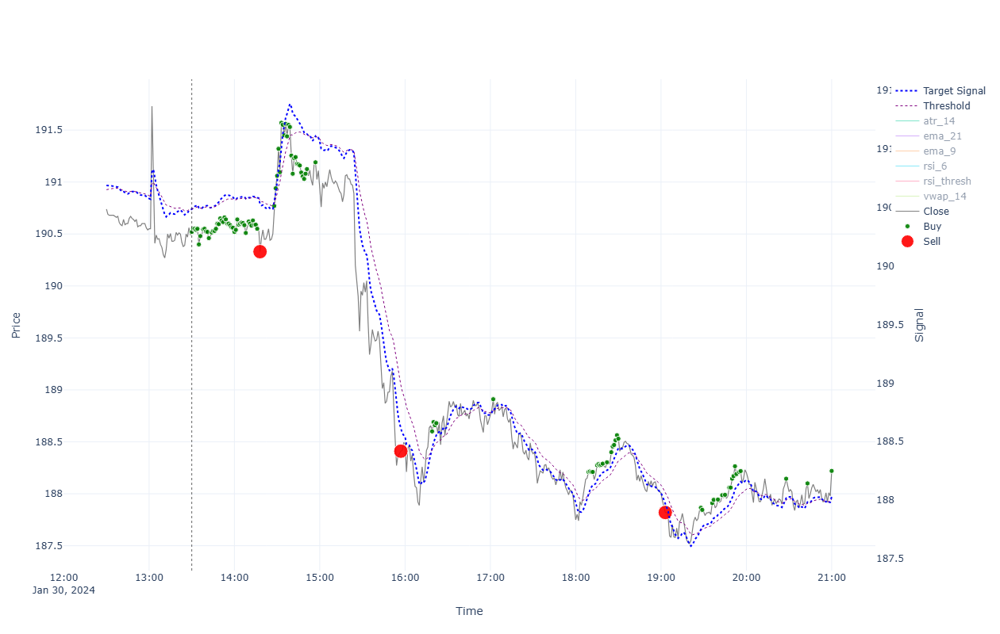


                                                  ******* Performance for 2024-01-30 *******

INTRADAY:
  shares(793); [ask_buy=190.558, fee_buy=0.004, pos_amnt_buy=151115.748]; [bid_sell=188.182, fee_sell=0.018, pos_amnt_sell=149214.082]; leftover=140.595; PNL=-1901.667
TRADES:
  Tr[1]: Time(13:30)Ask(190.558)Bid(190.482)Act(Buy)Shrs(1)Pos(254); CashTr(-190.562)=Cost(-190.558)-Fee(-0.004); P&L(119286.402)=CashTot(70904.0)+PosAmt(48382.402)
  Tr[2]: Time(13:31)Ask(190.588)Bid(190.512)Act(Buy)Shrs(1)Pos(255); CashTr(-190.592)=Cost(-190.588)-Fee(-0.004); P&L(119293.94)=CashTot(70713.408)+PosAmt(48580.532)
  Tr[3]: Time(13:32)Ask(190.588)Bid(190.512)Act(Buy)Shrs(1)Pos(256); CashTr(-190.592)=Cost(-190.588)-Fee(-0.004); P&L(119293.86)=CashTot(70522.816)+PosAmt(48771.044)
  Tr[4]: Time(13:33)Ask(190.578)Bid(190.502)Act(Buy)Shrs(1)Pos(257); CashTr(-190.582)=Cost(-190.578)-Fee(-0.004); P&L(119291.22)=CashTot(70332.234)+PosAmt(48958.986)
  Tr[5]: Time(13:34)Ask(190.588)Bid(190.512)Act(Buy)Shrs

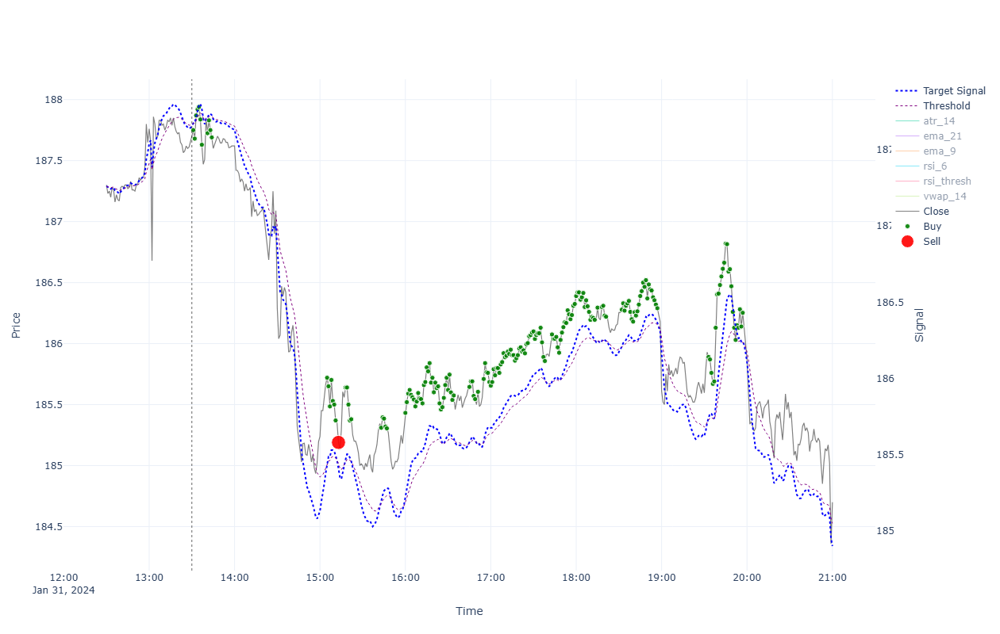


                                                  ******* Performance for 2024-01-31 *******

INTRADAY:
  shares(795); [ask_buy=187.738, fee_buy=0.004, pos_amnt_buy=149254.524]; [bid_sell=184.663, fee_sell=0.018, pos_amnt_sell=146792.634]; leftover=100.152; PNL=-2461.891
TRADES:
  Tr[1]: Time(13:31)Ask(187.788)Bid(187.712)Act(Buy)Shrs(1)Pos(44); CashTr(-187.792)=Cost(-187.788)-Fee(-0.004); P&L(118884.503)=CashTot(110625.155)+PosAmt(8259.348)
  Tr[2]: Time(13:32)Ask(187.718)Bid(187.642)Act(Buy)Shrs(1)Pos(45); CashTr(-187.722)=Cost(-187.718)-Fee(-0.004); P&L(118881.345)=CashTot(110437.434)+PosAmt(8443.911)
  Tr[3]: Time(13:33)Ask(187.908)Bid(187.832)Act(Buy)Shrs(1)Pos(46); CashTr(-187.912)=Cost(-187.908)-Fee(-0.004); P&L(118889.814)=CashTot(110249.522)+PosAmt(8640.292)
  Tr[4]: Time(13:34)Ask(187.958)Bid(187.882)Act(Buy)Shrs(1)Pos(47); CashTr(-187.962)=Cost(-187.958)-Fee(-0.004); P&L(118892.034)=CashTot(110061.561)+PosAmt(8830.474)
  Tr[5]: Time(13:35)Ask(187.978)Bid(187.902)Act(Buy)Shr

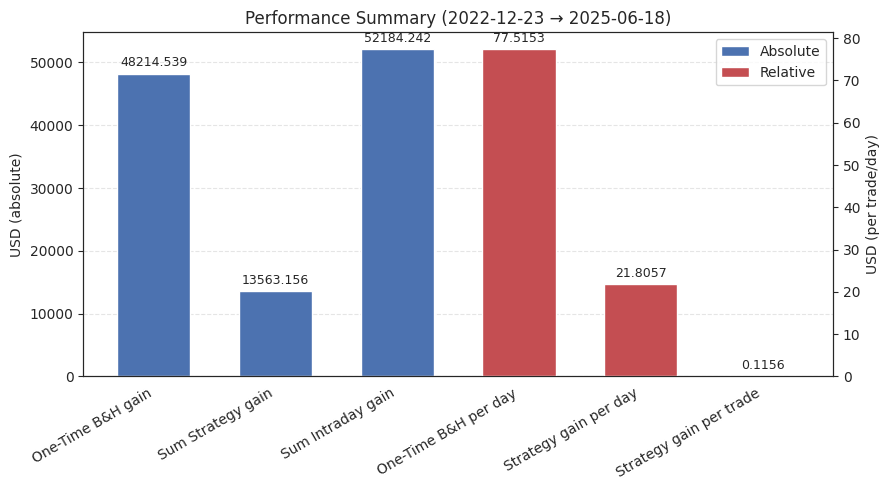

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2022-12 (2022-12-23 = 132.533 → 2022-12-30 = 129.814)
Num. trading days: 5  Trades Count: 1072
One-Time B&H gain: -2066.049 | start: 100000.000 | final: 97933.951 | PnL%: -2.07%
Sum Strategy gain: -867.712 | start: 100000.000 | final: 99132.288 | PnL%: -0.87%
Sum Intraday gain: -2121.013 | start: 100000.000 | final: 97878.987 | PnL%: -2.12%

Monthly Summary 2023-01 (2023-01-03 = 129.814 → 2023-01-31 = 144.151)
Num. trading days: 20  Trades Count: 4439
One-Time B&H gain: 10809.949 | start: 97933.951 | final: 108743.900 | PnL%: 11.04%
Sum Strategy gain: 2569.589 | start: 99132.288 | final: 101701.877 | PnL%: 2.59%
Sum Intraday gain: 9334.150 | start: 97878.987 | final: 107213.137 | PnL%: 9.54%

Monthly Summary 2023-02 (2023-02-01 = 144.151 → 2023-02-28 = 147.361)
Num. trading days: 19  Trades Count: 3833
One-Time B&H gain: 2419.801 | start: 108743.900 | final: 111163.701 | PnL%: 2.23%
Sum Strategy gai

In [5]:
importlib.reload(params) ######
# importlib.reload(strategies) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_at_date,
            performance_stats  = stats_at_date,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "-"*150 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds_test,
                                 sim_results = sim_results,
                                 sess_start = sess_start)
